# Dry Advection

The `Cocip` model is designed to simulate the evolution and radiative forcing of a contrail over its lifetime. The model is intricate, relying on a number of meteorological variables and parameters governing the cloud microphysics.

If we are only interested in the evolution of the exhaust plume, we can use the `DryAdvection` model instead. This model is much simpler, and only requires the initial plume properties and a handful of meteorological variables (wind and temperature). This notebook demonstrates how to use the `DryAdvection` model and compares the results to the `Cocip` model.

In [1]:
import pathlib

import matplotlib.pyplot as plt
import pandas as pd

from pycontrails import Flight
from pycontrails.datalib.ecmwf import ERA5
from pycontrails.models.cocip import Cocip
from pycontrails.models.dry_advection import DryAdvection
from pycontrails.models.humidity_scaling import ConstantHumidityScaling
from pycontrails.models.ps_model import PSFlight
from pycontrails.physics import units

plt.rcParams["figure.figsize"] = (10, 6)

## Load data

Following patterns already used in the in the [CoCiP notebook](CoCiP.ipynb).

### Meteorological data

In [2]:
time_bounds = ("2022-03-01 00:00:00", "2022-03-01 12:00:00")
pressure_levels = (300, 250, 200)

era5pl = ERA5(
    time=time_bounds,
    variables=Cocip.met_variables + Cocip.optional_met_variables,
    pressure_levels=pressure_levels,
)
era5sl = ERA5(time=time_bounds, variables=Cocip.rad_variables)

met = era5pl.open_metdataset()
rad = era5sl.open_metdataset()

## Example flight

In [3]:
df = pd.read_csv("flight.csv")

# Clip at 33,000 ft to hit more ISSR
df["altitude"] = df["altitude"].clip(upper=units.ft_to_m(33000))

# Create a flight instance
fl = Flight(df, aircraft_type="A320", flight_id="example")

## Run `DryAdvection` and visualize plume evolution

In [4]:
dt_integration = pd.Timedelta("2T")
max_age = pd.Timedelta("6h")

params = {
    "dt_integration": dt_integration,
    "max_age": max_age,
    "depth": 50.0,  # initial plume depth, [m]
    "width": 40.0,  # initial plume width, [m]
}
dry_adv = DryAdvection(met, params)
dry_adv_df = dry_adv.eval(fl).dataframe

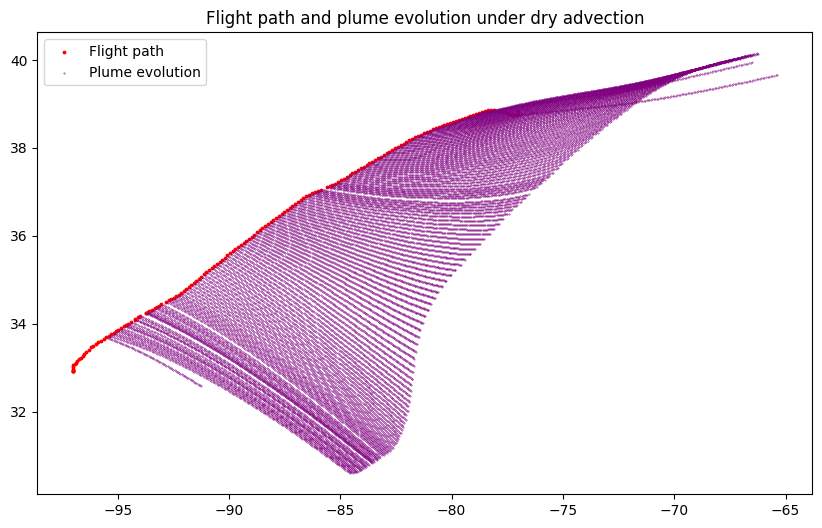

In [5]:
ax = plt.axes()

ax.scatter(fl["longitude"], fl["latitude"], s=3, color="red", label="Flight path")
ax.scatter(
    dry_adv_df["longitude"], dry_adv_df["latitude"], s=0.1, color="purple", label="Plume evolution"
)
ax.legend()
ax.set_title("Flight path and plume evolution under dry advection");

## Run `Cocip` and visualize evolution

In [6]:
params = {
    "dt_integration": dt_integration,
    "max_age": max_age,
    "humidity_scaling": ConstantHumidityScaling(rhi_adj=0.9),
    "aircraft_performance": PSFlight(),
}
cocip = Cocip(met, rad, params)
cocip.eval(fl)
cocip_df = cocip.contrail

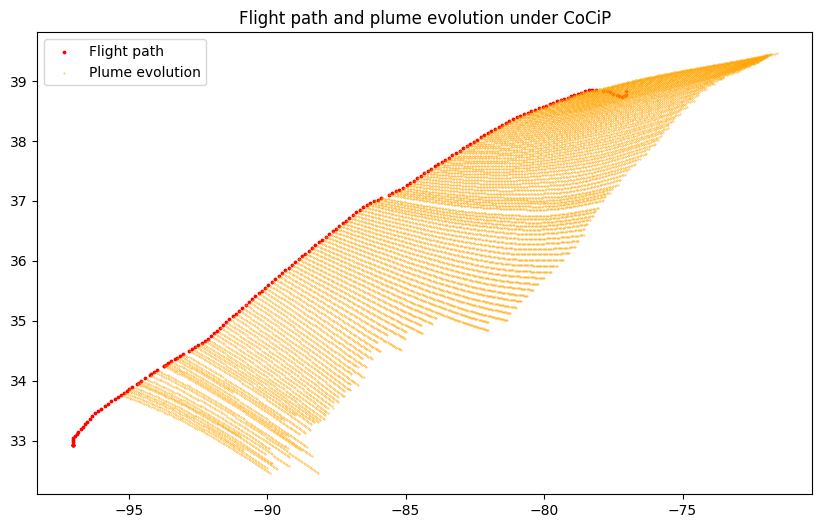

In [7]:
ax = plt.axes()

ax.scatter(fl["longitude"], fl["latitude"], s=3, color="red", label="Flight path")
ax.scatter(
    cocip_df["longitude"], cocip_df["latitude"], s=0.1, color="orange", label="Plume evolution"
)
ax.legend()
ax.set_title("Flight path and plume evolution under CoCiP");

## Comparison with CoCiP

|  | Dry Advection | CoCiP |
| --- | --- | --- |
| Horizontal advection | Yes | Yes |
| Vertical advection | Yes | Yes |
| Assumes elliptical plume | Yes | Yes |
| Evolves plume geometry (width, depth) | Yes | Yes |
| Possible to run in pointwise mode (no width nor depth) | Yes | No |
| Considers ice growth and sedimentation | No | Yes |
| Calculates radiative forcing | No | Yes |
| Models cloud microphysics | No | Yes |
| Calculates end of life condition at each time step | No | Yes |
| Requires aircraft performance model | No | Yes |
| Allows arbitrary initial ellipse dimensions (width, depth) | Yes | No |

### Visualize advected altitude

While the horizontal position of the advected waypoints are relatively similar in both simulations, the altitude of the evolved plume can substantially differ. In CoCiP, the initial contrail is calculated based on an assumed downwash simulation. This typically lowers the contrail depth several hundred meters below the altitude of the flight path. In addition, because CoCiP simulates ice crystal growth and sedimentation, the contrail altitude typically decreases as ice crystals grow and sediment. The dry advection model does not consider sedimentation, and the plume altitude is initially assumed to be the same as the flight altitude. The following figure shows the altitude of the advected waypoints in both simulations.

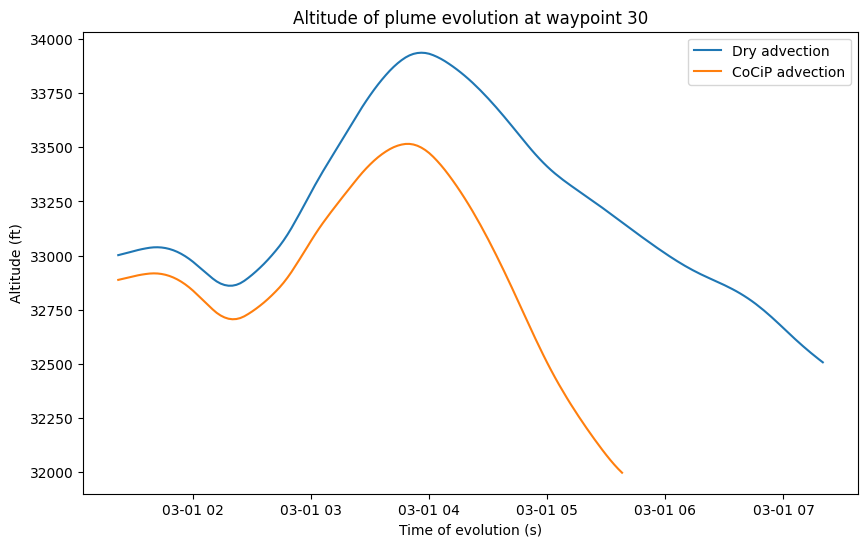

In [8]:
# Consider a sample waypoint
waypoint = 30
tmp1 = dry_adv_df.query(f"waypoint == {waypoint}")
tmp2 = cocip_df.query(f"waypoint == {waypoint}")

ax = plt.axes()
ax.plot(tmp1["time"], units.pl_to_ft(tmp1["level"]), label="Dry advection")
ax.plot(tmp2["time"], units.pl_to_ft(tmp2["level"]), label="CoCiP advection")
ax.set_xlabel("Time of evolution (s)")
ax.set_ylabel("Altitude (ft)")
ax.set_title(f"Altitude of plume evolution at waypoint {waypoint}")
ax.legend();

### Visualize advected width

Both CoCiP and dry advection assume the geometry of the plume has an elliptical cross section. The width and depth of this plume evolve according to wind shear effects. Presently, the wind shear enhancement in `Cocip` is not implemented in `DryAdvection`. This explains why the `Cocip`-derived plume is typically wider than the `DryAdvection`-derived plume.

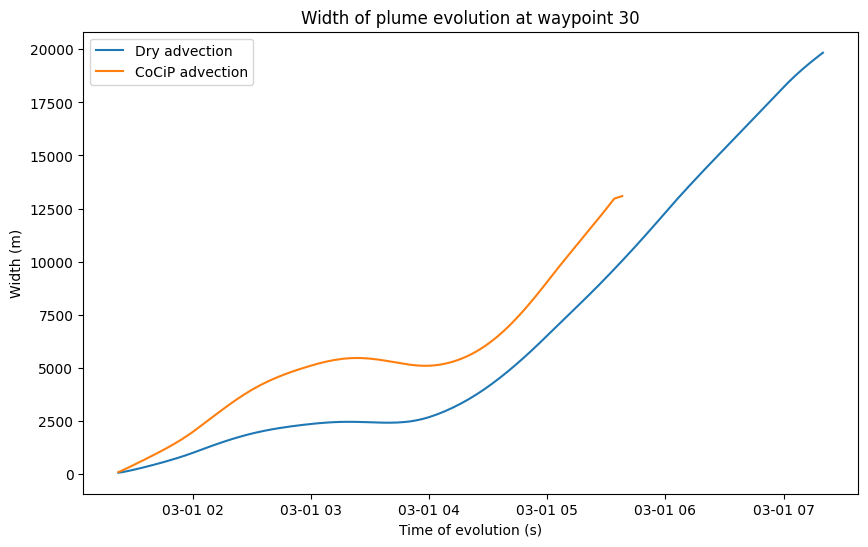

In [9]:
ax = plt.axes()
ax.plot(tmp1["time"], tmp1["width"], label="Dry advection")
ax.plot(tmp2["time"], tmp2["width"], label="CoCiP advection")
ax.set_xlabel("Time of evolution (s)")
ax.set_ylabel("Width (m)")
ax.set_title(f"Width of plume evolution at waypoint {waypoint}")
ax.legend();

## Animate the two evolutions

In [10]:
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import Image

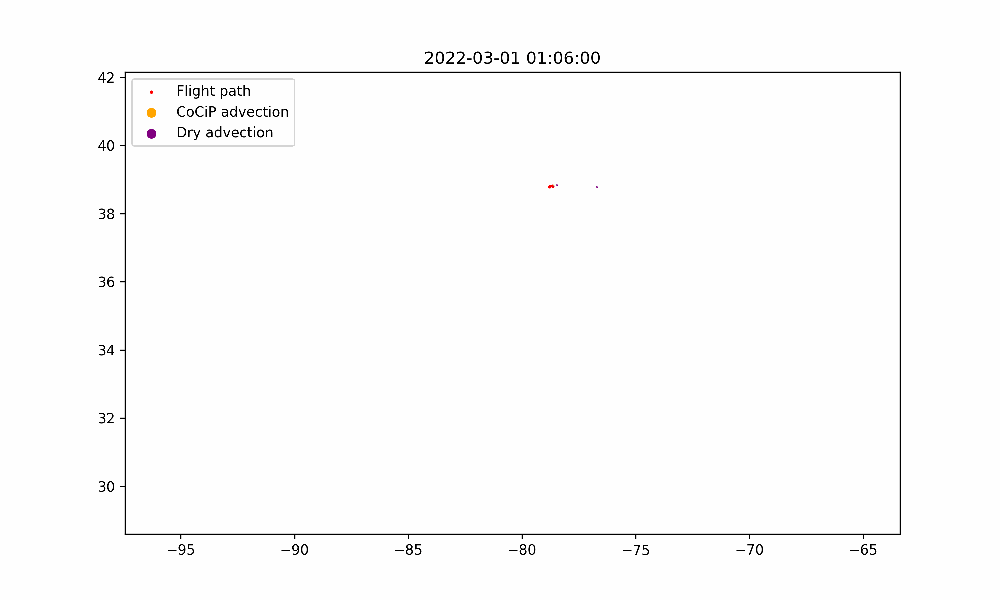

In [11]:
fig, ax = plt.subplots()
ax.set_xlim(dry_adv_df["longitude"].min() - 2, dry_adv_df["longitude"].max() + 2)
ax.set_ylim(dry_adv_df["latitude"].min() - 2, dry_adv_df["latitude"].max() + 2)

scat1 = ax.scatter([], [], s=2, color="red", label="Flight path")
scat2 = ax.scatter([], [], color="orange", label="CoCiP advection")
scat3 = ax.scatter([], [], color="purple", label="Dry advection")
ax.legend(loc="upper left")

source_frames = fl.dataframe.groupby(fl.dataframe["time"].dt.ceil(dt_integration))
dry_adv_frames = dry_adv_df.groupby(dry_adv_df["time"].dt.ceil(dt_integration))
cocip_frames = cocip_df.groupby(cocip_df["time"].dt.ceil(dt_integration))


times = cocip_frames.indices


def animate(time):
    ax.set_title(time)

    try:
        group = source_frames.get_group(time)
    except KeyError:
        offsets = [[None, None]]
    else:
        offsets = group[["longitude", "latitude"]]
    scat1.set_offsets(offsets)

    group = cocip_frames.get_group(time)
    offsets = group[["longitude", "latitude"]]
    width = 1e-3 * group["width"]
    scat2.set_offsets(offsets)
    scat2.set_sizes(width)

    group = dry_adv_frames.get_group(time)
    offsets = group[["longitude", "latitude"]]
    width = 1e-3 * group["width"]
    scat3.set_offsets(offsets)
    scat3.set_sizes(width)

    return scat1, scat2


plt.close()
ani = FuncAnimation(fig, animate, frames=times)
filename = pathlib.Path("evo.gif")
ani.save(filename, dpi=300, writer=PillowWriter(fps=10))

# Show the gif
display(Image(data=filename.read_bytes(), format="png"))

# Cleanup
filename.unlink()